In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
import time
import sys
sys.path.append('../../../..')
import gp2
from gp2 import Runner
from keras import losses, metrics
from tensorflow.keras import optimizers

In [3]:
R = Runner(verbose=True)

*** GP2 ***
Working directory: /tmp/tmpod5piddbGP2
Verbose mode active!


In [4]:
C = gp2.KUC_UNet2D(workingdir=R.workingdir)

*** GP2  KUC UNet2D ***
Working directory: /tmp/tmpod5piddbGP2


In [5]:
R.classifier = C

In [6]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_masks.npy')

In [7]:
images.shape

(12311, 512, 512, 1)

In [8]:
masks.shape

(12311, 512, 512, 1)

In [9]:
R.run(images=images, masks=masks, runs=2, batch_size=16)

Weights OK!
******
Loop 1
****** TRAINING CLASSIFIER ******
Epoch 1/100
39/39 [==============================] - 37s 687ms/step - loss: 0.5700 - dice_coeff: 0.3005 - val_loss: 0.5469 - val_dice_coeff: 0.2954
Epoch 2/100
39/39 [==============================] - 19s 484ms/step - loss: 0.5057 - dice_coeff: 0.3288 - val_loss: 0.4662 - val_dice_coeff: 0.4028
Epoch 3/100
39/39 [==============================] - 19s 484ms/step - loss: 0.4441 - dice_coeff: 0.4502 - val_loss: 0.4902 - val_dice_coeff: 0.5909
Epoch 4/100
39/39 [==============================] - 19s 483ms/step - loss: 0.4209 - dice_coeff: 0.5096 - val_loss: 0.4186 - val_dice_coeff: 0.5277
Epoch 5/100
39/39 [==============================] - 19s 485ms/step - loss: 0.4271 - dice_coeff: 0.5015 - val_loss: 0.4211 - val_dice_coeff: 0.5150
Epoch 6/100
39/39 [==============================] - 19s 485ms/step - loss: 0.4160 - dice_coeff: 0.5150 - val_loss: 0.4386 - val_dice_coeff: 0.5020
Epoch 7/100
39/39 [==============================] -

In [10]:
R.classifier_scores

[[0.4616076946258545, 0.5270634293556213],
 [0.4818001389503479, 0.4640495181083679]]

In [11]:
R.discriminator_scores

[[0.0, 1.0], [0.0, 1.0]]

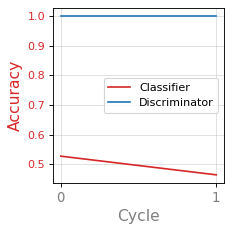

In [12]:
R.plot()

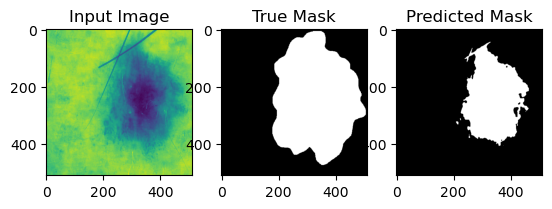

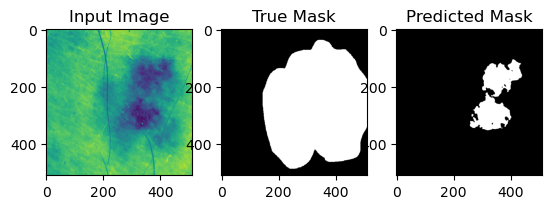

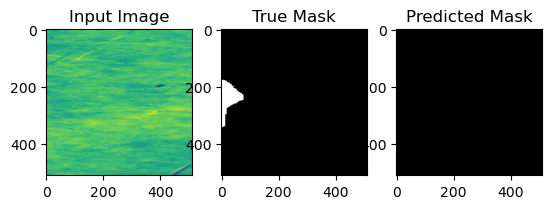

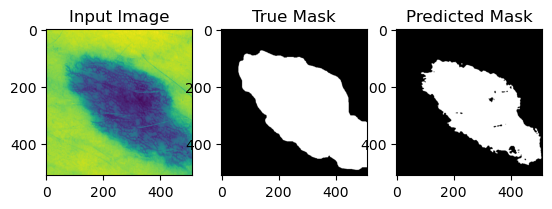

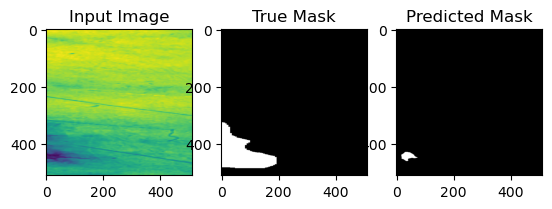

...

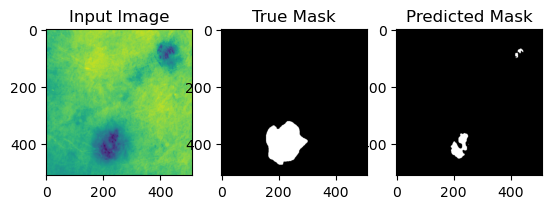

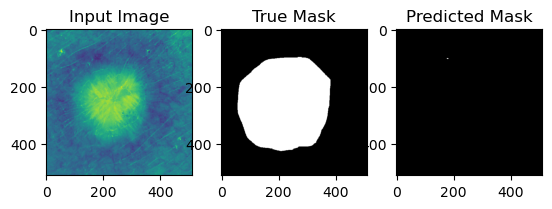

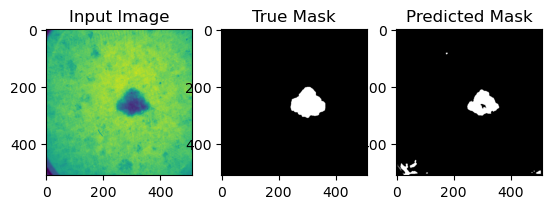

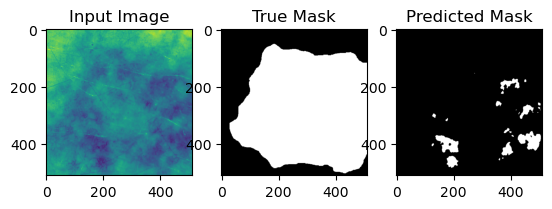

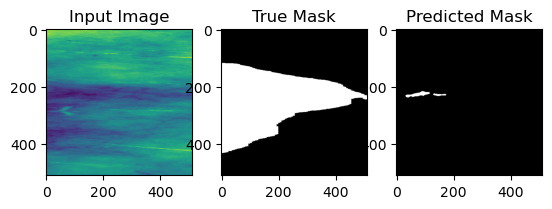

In [13]:
gp2.Util.visualize_predictions(C, images, masks) # with run=2

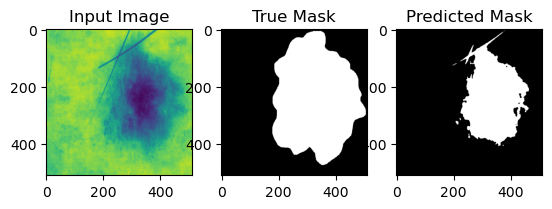

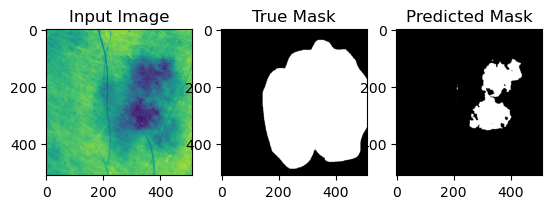

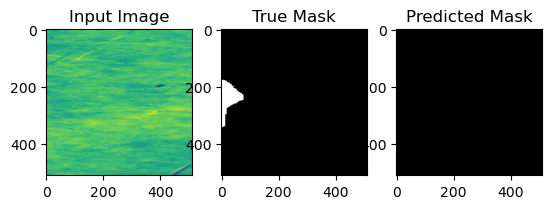

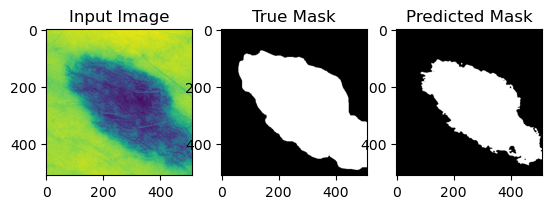

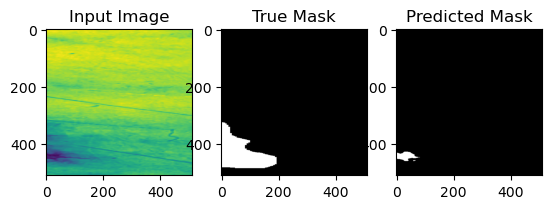

...

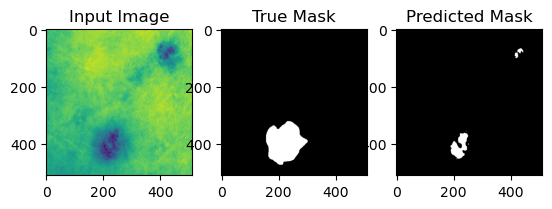

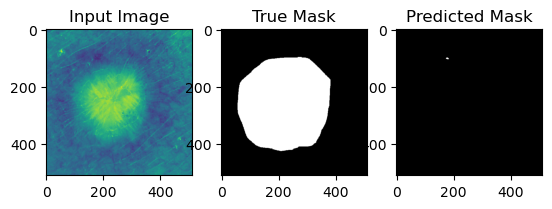

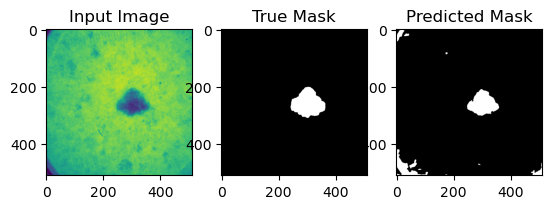

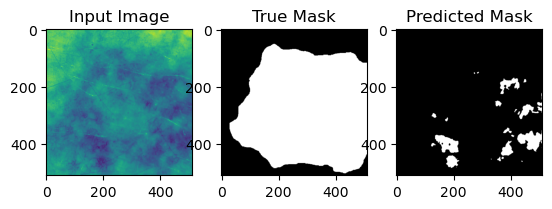

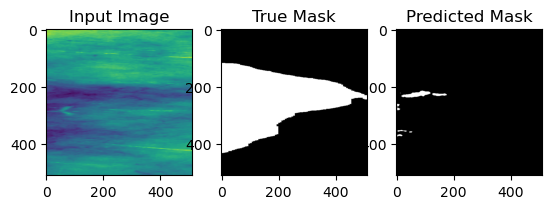

In [14]:
gp2.Util.visualize_predictions(C, images, masks) # with run=1